# Redoing Jaz' DPT scRNAseq analysis (Pre-processing done by Kelvin prior)

In [3]:
## import packages

import os
import scanpy as sc
import pandas as pd
import dandelion as ddl
from tqdm import tqdm

In [4]:
# show current cirectory
os.getcwd()

'/Users/uqssoon/Documents/Projects/Jaz-project/notebooks'

In [5]:
# print software versions
sc.logging.print_header()

/Users/uqssoon/anaconda3/envs/Jaz2023_env/lib/python3.11/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
/Users/uqssoon/anaconda3/envs/Jaz2023_env/lib/python3.11/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
/Users/uqssoon/anaconda3/envs/Jaz2023_env/lib/python3.11/site-packages/umap/distances.

scanpy==1.9.3 anndata==0.9.2 umap==0.5.3 numpy==1.24.4 scipy==1.11.1 pandas==2.0.3 scikit-learn==1.3.0 statsmodels==0.14.0 python-igraph==0.10.6 pynndescent==0.5.10


/Users/uqssoon/anaconda3/envs/Jaz2023_env/lib/python3.11/site-packages/umap/umap_.py:660: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.


In [6]:
# print dandelion version
ddl.logging.print_header()

dandelion==0.3.2 pandas==2.0.3 numpy==1.24.4 matplotlib==3.7.2 networkx==3.1 scipy==1.11.1


In [7]:
## set fig params..

sc.settings.set_figure_params(dpi=80, facecolor= "white")

Pre-processing to concatenate all raw files from cellranger here (done by Kelvin) - do not run this.

In [ ]:
#### Pre-processing has been done by Kelvin in his notebooks

#### These are steps for reading in the raw data - don't run this!

#RAWFOLDER = "/QRISdata/Q5688/GONZ-0001_run2/count"
# also specify the names of the folders (sans _GEX for simplicity)
#samples = [
    "CD4_L01",
    "CD4_P01",
    "CD4_WY",
    "CD8_L01",
    "CD8_P01",
    "CD8_WY",
    "DP_L01",
    "DP_P01",
    "DP_WY",
    "V_CD4",
    "V_CD8",
    "V_DP",
#]

# each is an individual run where it is donor_celltype, so 4 donors, 3 celltypes per donor

### use a for-loop to read in files, add them to a list and concatenate them

#from pathlib import Path

#adata_list = []  # create an empty list first
#for sample in tqdm(samples):
    # we will use Path to construct the path to the 10x file
    # you can also just use
    # file_path = "/QRISdata/Q5688/GONZ-0001/count/" + sample + "_GEX/outs/filtered_feature_bc_matrix.h5"
    # exactly the same
    #file_path = (
    #    Path(RAWFOLDER) / (sample + "_GEX") / "outs" / "filtered_feature_bc_matrix.h5"
    #)
    #tmp = sc.read_10x_h5(file_path)
    #tmp.var_names_make_unique()
    # update the metadata with the sample folder info
    #tmp.obs["sample"] = sample
    #if sample.split("_")[0] == "V":                  ### splitting string by "_" and selecting the first string, eg V_CD4, it will write in "sort.type" as CD4
    #    tmp.obs["sort_type"] = sample.split("_")[
    #        1
    #    ]  # split based on _ and select the second
    #    tmp.obs["donor"] = sample.split("_")[0]  # split based on _ and select the first     ### splitting string by "_" and selecting the zeroth string, eg V_CD4, it will write in "donor" as V
    #else:                  ## for every other sample that where sample.split("_")[0] does not equal V, eg CD4_L01
    #    tmp.obs["sort_type"] = sample.split("_")[                   #in this case, take zeroth string and add to sort type, so here, CD4 will be added
    #        0
    #    ]  # split based on _ and select the first
    #    tmp.obs["donor"] = sample.split("_")[                       #in this case, take first string and add to donor, so here, L01 will be added
    #        1
    #    ]  # split based on _ and select the second
    #### adjust the cell barcode name so that there won't be duplicates later
    #tmp.obs_names = [sample + "_" + n for n in tmp.obs_names]
    # generate some QC metrics
   ##### tmp.var["mt"] = tmp.var_names.str.startswith(
        "MT-"
    #)  # annotate the group of mitochondrial genes as 'mt'
    #sc.pp.calculate_qc_metrics(
    #    tmp, qc_vars=["mt"], percent_top=None, log1p=False, inplace=True
    #)
    ###### dandelion has a quick recipe function to quickly mark doublets and bad quality cells
    #ddl.pp.external.recipe_scanpy_qc(
    #    tmp, max_genes=10000, mito_cutoff=None, mito_startswith="MT-"
    #)
    ##### ok now append the list to include each file
    #adata_list.append(tmp)



#########concatenate
# adata = adata_list[0].concatenate(adata_list[1:], index_unique=None)               #you are selecting the zeroth adata, and then concatenating it with with the first and so on until the end
# keep only relevant columns in part of the object
#adata.var = adata.var[["gene_ids", "feature_types", "genome", "mt"]]      #feature types is from features.rsv - usually for multimodal data, here we only have genes so "Gene expression" is the only feature
#adata

The different data file: 

1. raw data before ANY filtering
"raw_adata_v2.h5ad"

2. processed data after filtering and HV gene calculation
"adata_processed_v2.h5ad"

3. processed data after filtering, HV gene calculation and BBKNN batch correction
"adata_processed_bbknn_v2.h5ad"

Kelvin also did some quick check of T cells scores for quick annotation using -cell typist

4. After everything, he added TCR to get ready for Dandelion
"adata_processed_v2_tcr.h5ad"

In [8]:
##### I am going to strat from the concatenated raw datafile... 

# first connect to the path - because files are stored in RDM - make sure you are on UQ network either directly or via VPN

from pathlib import Path
out_path = Path("/Volumes/KTDDL23-Q5935/scDPT/") / "kelvin" / "h5ad"
#alternative: out_path = Path("/Volumes/KTDDL23-Q5935/scDPT/kelvin/h5ad")

In [7]:
#read in data folder

adata = sc.read_h5ad(out_path/"raw_adata_v2.h5ad")

In [8]:
adata
#### note: this adata has gone through some pre-processing CALCULATIONS but have NOT been filtered... 

AnnData object with n_obs × n_vars = 116772 × 36601
    obs: 'sample', 'sort_type', 'donor', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'scrublet_score', 'n_genes', 'gmm_pct_count_clusters_keep', 'is_doublet', 'filter_rna', 'batch'
    var: 'gene_ids', 'feature_types', 'genome', 'mt'
    uns: 'filter_rna_colors'

# Quality control


These are the steps that Kelvin did to obtain some PP parameters AFTER concatenating raw output from cell ranger, BEFORE saving it as "raw_adata_v2.h5ad"

When Kelvin ran 
`ddl.pp.external.recipe_scanpy_qc(
        tmp, max_genes=10000, mito_cutoff=None, mito_startswith="MT-"
)`, he applied a quick "recipe" function from ddl to help compute PP output using these parameters in this context: {cells need to have 10,000 genes, and no mito_cutoff done}. It uses a gmm model (whatever this is) to decide which cells pass or not.. 

It then creates a "filter_rna" column to store the final outoput, whether a cell passes QC (False), or not (True). 




In [9]:
## to quickly look at our metadata:
adata.obs #observational file (for cells)
#adata.var #variable level (for genes)

,sample,sort_type,donor,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,scrublet_score,n_genes,gmm_pct_count_clusters_keep,is_doublet,filter_rna,batch
CD4_L01_AAACCTGAGAACTGTA-1,CD4_L01,CD4,L01,986,2347.0,13.0,0.553899,0.182979,986,False,False,True,0
CD4_L01_AAACCTGAGAGCTATA-1,CD4_L01,CD4,L01,722,1726.0,14.0,0.811124,0.456193,722,True,False,False,0
CD4_L01_AAACCTGAGGAGCGAG-1,CD4_L01,CD4,L01,562,1443.0,15.0,1.039501,0.156962,562,True,False,False,0
CD4_L01_AAACCTGAGGCAGTCA-1,CD4_L01,CD4,L01,507,1141.0,4.0,0.350570,0.216129,507,True,False,False,0
CD4_L01_AAACCTGAGTCAAGCG-1,CD4_L01,CD4,L01,602,1410.0,16.0,1.134752,0.408219,602,True,False,False,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
V_DP_TTTGTCAGTTCGTGAT-1,V_DP,DP,V,536,1355.0,13.0,0.959410,0.220339,536,False,False,True,11
V_DP_TTTGTCATCAGCTTAG-1,V_DP,DP,V,496,1067.0,1.0,0.093721,0.163418,496,False,False,True,11
V_DP_TTTGTCATCCTTGCCA-1,V_DP,DP,V,439,1000.0,0.0,0.000000,0.211679,439,True,False,False,11
V_DP_TTTGTCATCGCCATAA-1,V_DP,DP,V,540,1165.0,0.0,0.000000,0.220339,540,True,False,False,11


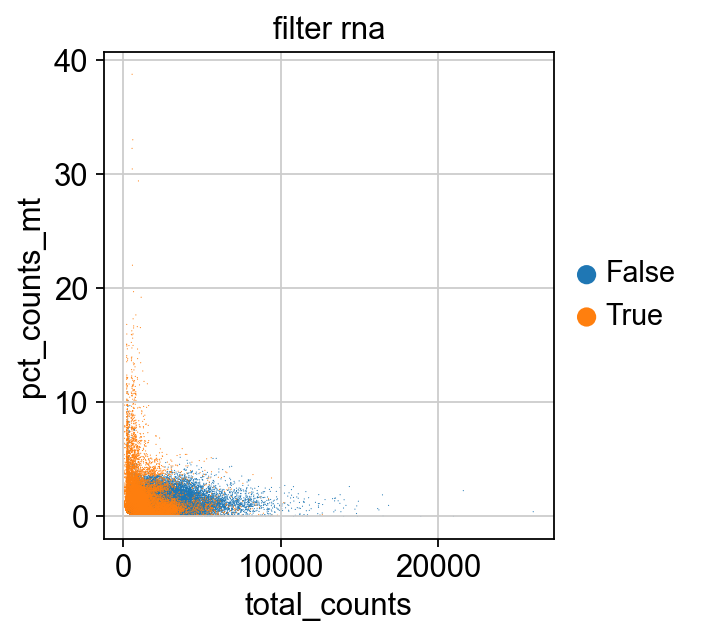

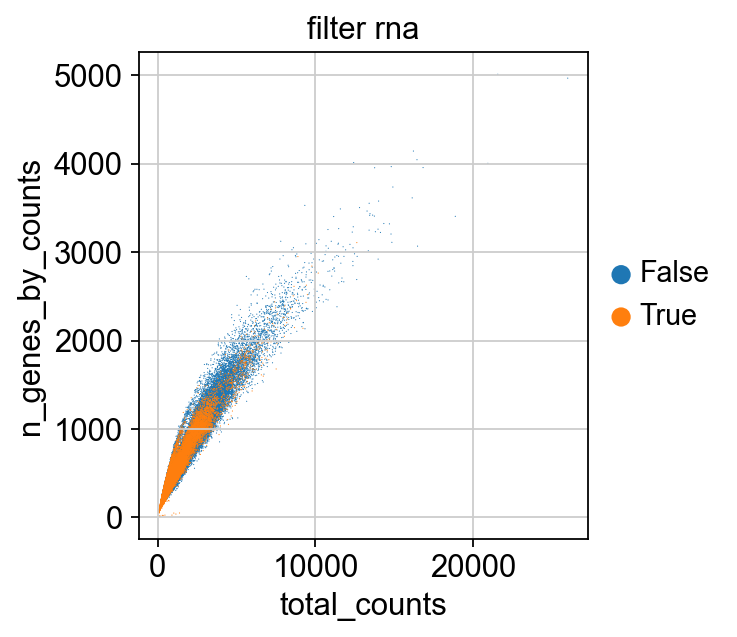

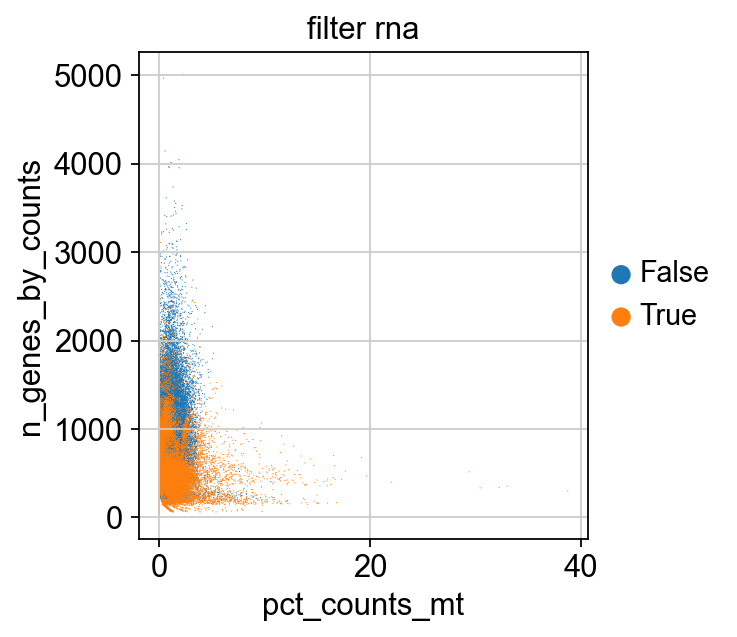

In [10]:
# Now let's visualise some QC metrics

sc.pl.scatter(adata, x = "total_counts", y= "pct_counts_mt", color= "filter_rna")
sc.pl.scatter(adata, x = "total_counts", y = "n_genes_by_counts", color = "filter_rna")
sc.pl.scatter(adata, x = "pct_counts_mt", y = "n_genes_by_counts", color = "filter_rna")

# n_genes_by_counts = number of genes with positive counts in a cell (similar to nFeature_RNA in seurat)
# total_counts = total number of counts for a cell, which is also known as library size (similar to nCount_RNA in seurat = nUMI)

In [11]:
###### Tabulate number of cells per sample... 

# tabulate # of the cells that can be analysed (false is good here)
pd.crosstab(adata.obs["sample"], adata.obs["filter_rna"])

#cross tab: https://stackoverflow.com/questions/21247203/how-to-make-a-pandas-crosstab-with-percentages
# https://pandas.pydata.org/docs/reference/api/pandas.crosstab.html
# https://pbpython.com/pandas-crosstab.html


############## 
# Crappy samples:
# For CD4: P01 and V
# For CD8: L01 and V
# For DP: L01 and WY


filter_rna,False,True
sample,,
CD4_L01,9950,1437
CD4_P01,8115,3890
CD4_WY,11674,439
CD8_L01,1328,8136
CD8_P01,6659,2123
CD8_WY,9440,1923
DP_L01,1765,4900
DP_P01,5074,3353
DP_WY,1967,4611


In [12]:
## redo this as percentage
# Basically you just have the function that does row/row.sum(), and you use apply with axis=1 to apply it by row.
pd.crosstab(adata.obs["sample"], adata.obs["filter_rna"]).apply(
    lambda row: row/row.sum() * 100, axis = 1 
)

filter_rna,False,True
sample,,
CD4_L01,87.380346,12.619654
CD4_P01,67.596835,32.403165
CD4_WY,96.375795,3.624205
CD8_L01,14.032122,85.967878
CD8_P01,75.825552,24.174448
CD8_WY,83.076652,16.923348
DP_L01,26.481620,73.518380
DP_P01,60.211226,39.788774
DP_WY,29.902706,70.097294


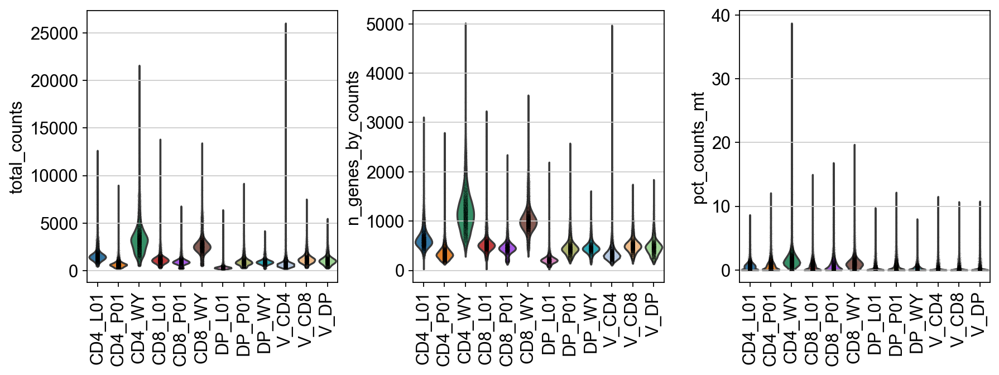

In [13]:
## Should try to plot vln plots for QC metrics too
sc.pl.violin(adata, ['total_counts', 'n_genes_by_counts', 'pct_counts_mt'], size = 0.1,
 groupby='sample', multi_panel = True, rotation = 90)

Continue processing with "good" cells only.. 

In [14]:
adata = adata[adata.obs["filter_rna"] == "False"].copy()

############## Things to ask Kelvin - why don't get mito cutoff to <5?


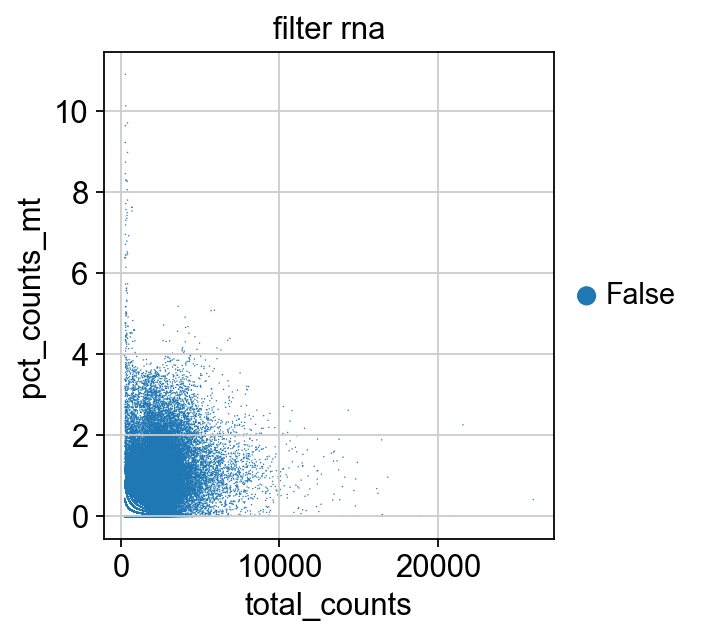

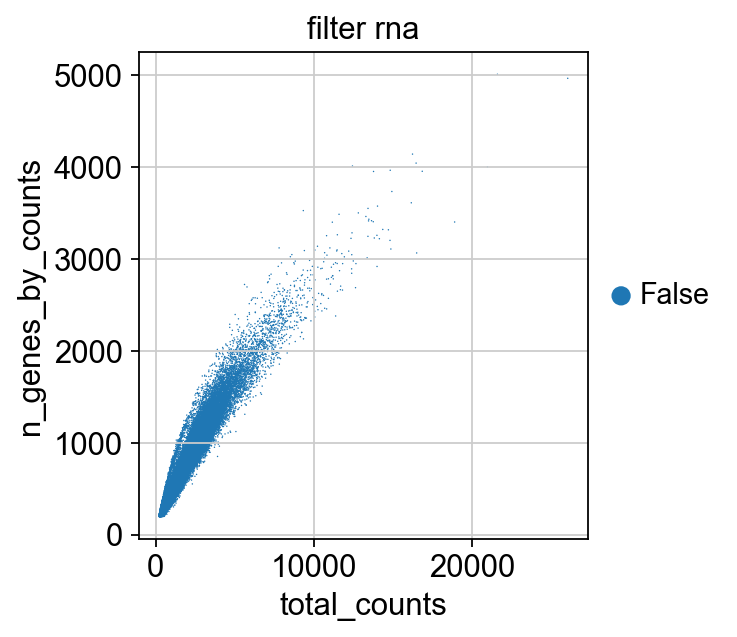

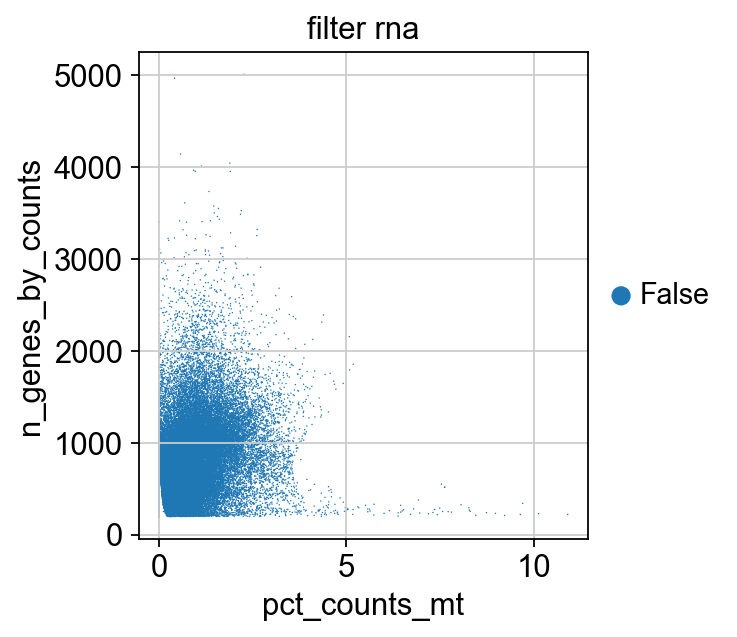

In [15]:
# Redo QC oplots
sc.pl.scatter(adata, x = "total_counts", y= "pct_counts_mt", color= "filter_rna")
sc.pl.scatter(adata, x = "total_counts", y = "n_genes_by_counts", color = "filter_rna")
sc.pl.scatter(adata, x = "pct_counts_mt", y = "n_genes_by_counts", color = "filter_rna")

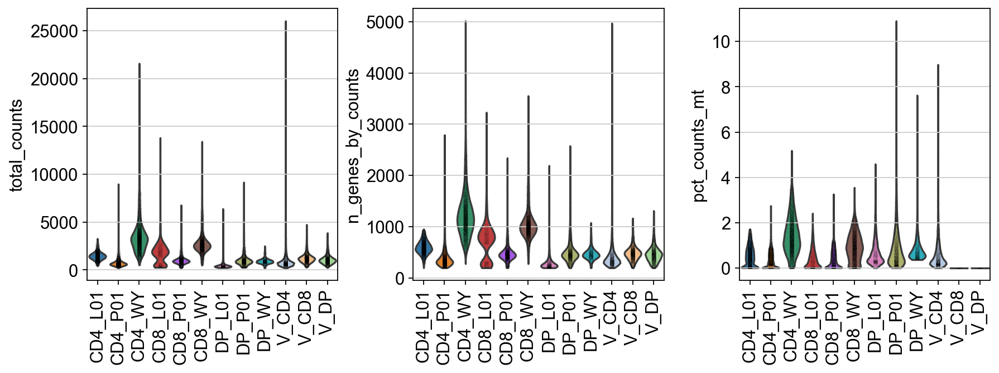

In [16]:
# also violin plot

sc.pl.violin(adata, ['total_counts', 'n_genes_by_counts', 'pct_counts_mt'], size = 0.1,
 groupby='sample', multi_panel = True, rotation = 90)

In [44]:
# maybe just do cutoff and see what happens... 
bdata = adata
bdata

AnnData object with n_obs × n_vars = 71564 × 36601
    obs: 'sample', 'sort_type', 'donor', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'scrublet_score', 'n_genes', 'gmm_pct_count_clusters_keep', 'is_doublet', 'filter_rna', 'batch'
    var: 'gene_ids', 'feature_types', 'genome', 'mt'
    uns: 'filter_rna_colors', 'sample_colors'

In [49]:
bdata = bdata[bdata.obs.pct_counts_mt <5, :]
bdata #71511
# I also want to filter out cells with low gene expression.. 
bdata = bdata[bdata.obs.n_genes_by_counts > 200, :]
bdata #71460

View of AnnData object with n_obs × n_vars = 71460 × 36601
    obs: 'sample', 'sort_type', 'donor', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'scrublet_score', 'n_genes', 'gmm_pct_count_clusters_keep', 'is_doublet', 'filter_rna', 'batch'
    var: 'gene_ids', 'feature_types', 'genome', 'mt'
    uns: 'filter_rna_colors', 'sample_colors'

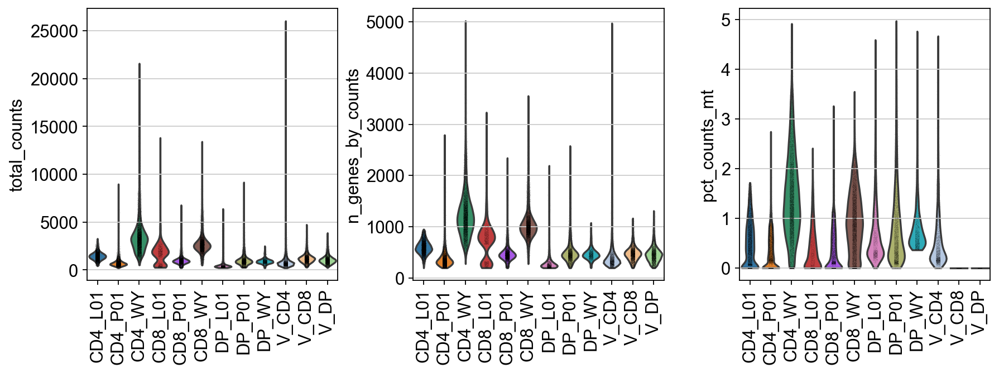

In [50]:
# also violin plot

sc.pl.violin(bdata, ['total_counts', 'n_genes_by_counts', 'pct_counts_mt'], size = 0.1,
 groupby='sample', multi_panel = True, rotation = 90)

 # didn't change too much - so ignore.. 

In [17]:
########### Anyway let's go back to the original data... adata

# remove uninformative genes for now - this filters out genes that are not expressed in least 3 cells.
sc.pp.filter_genes(adata, min_cells=3)
adata    # 71561 cells, 21591 genes


AnnData object with n_obs × n_vars = 71564 × 21591
    obs: 'sample', 'sort_type', 'donor', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'scrublet_score', 'n_genes', 'gmm_pct_count_clusters_keep', 'is_doublet', 'filter_rna', 'batch'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells'
    uns: 'filter_rna_colors', 'sample_colors'

## NORMALISATION

In [18]:
# Total-count normalize (library-size correct) the data matrix 𝐗 to 10,000 reads per cell, so that counts become comparable among cells.
sc.pp.normalize_total(adata, target_sum=1e4)
# Logarithmize the data:
sc.pp.log1p(adata)


## Highly variable Genes

In [19]:
# Identify highly-variable genes.
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
adata

AnnData object with n_obs × n_vars = 71564 × 21591
    obs: 'sample', 'sort_type', 'donor', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'scrublet_score', 'n_genes', 'gmm_pct_count_clusters_keep', 'is_doublet', 'filter_rna', 'batch'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'filter_rna_colors', 'sample_colors', 'log1p', 'hvg'

In [20]:
# to see genes
adata.var   #there is now a hvg column

,gene_ids,feature_types,genome,mt,n_cells,highly_variable,means,dispersions,dispersions_norm
AL627309.1,ENSG00000238009,Gene Expression,GRCh38,False,28,False,0.002955,2.668805,1.095161
AL627309.5,ENSG00000241860,Gene Expression,GRCh38,False,14,False,0.001691,2.715631,1.237420
LINC01409,ENSG00000237491,Gene Expression,GRCh38,False,1119,False,0.107368,2.426608,0.359353
FAM87B,ENSG00000177757,Gene Expression,GRCh38,False,9,False,0.001084,2.303611,-0.014320
LINC01128,ENSG00000228794,Gene Expression,GRCh38,False,1500,False,0.119151,2.242956,-0.198594
...,...,...,...,...,...,...,...,...,...
AL354822.1,ENSG00000278384,Gene Expression,GRCh38,False,84,False,0.008451,2.423547,0.350051
AL592183.1,ENSG00000273748,Gene Expression,GRCh38,False,738,True,0.073456,2.578236,0.820007
AC240274.1,ENSG00000271254,Gene Expression,GRCh38,False,124,False,0.011603,2.549724,0.733385
AC004556.3,ENSG00000276345,Gene Expression,GRCh38,False,782,False,0.060707,2.211048,-0.295533


In [21]:
### to get structure of dataframe
adata.var.info()
adata.obs.info()

### to get the number of HV genes... because the column "highly_variable" is a boolean vector - ie it gives True (1) or False (0), you can use sum function to know... 
print(adata.var.highly_variable.sum())    #2373 HVG genes..

<class 'pandas.core.frame.DataFrame'>
Index: 21591 entries, AL627309.1 to AC007325.4
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   gene_ids          21591 non-null  object  
 1   feature_types     21591 non-null  category
 2   genome            21591 non-null  category
 3   mt                21591 non-null  bool    
 4   n_cells           21591 non-null  int64   
 5   highly_variable   21591 non-null  bool    
 6   means             21591 non-null  float64 
 7   dispersions       21591 non-null  float64 
 8   dispersions_norm  21591 non-null  float32 
dtypes: bool(2), category(2), float32(1), float64(2), int64(1), object(1)
memory usage: 1.5+ MB
<class 'pandas.core.frame.DataFrame'>
Index: 71564 entries, CD4_L01_AAACCTGAGAGCTATA-1 to V_DP_TTTGTCATCTTGTTTG-1
Data columns (total 13 columns):
 #   Column                       Non-Null Count  Dtype   
---  ------                       --------------  ---

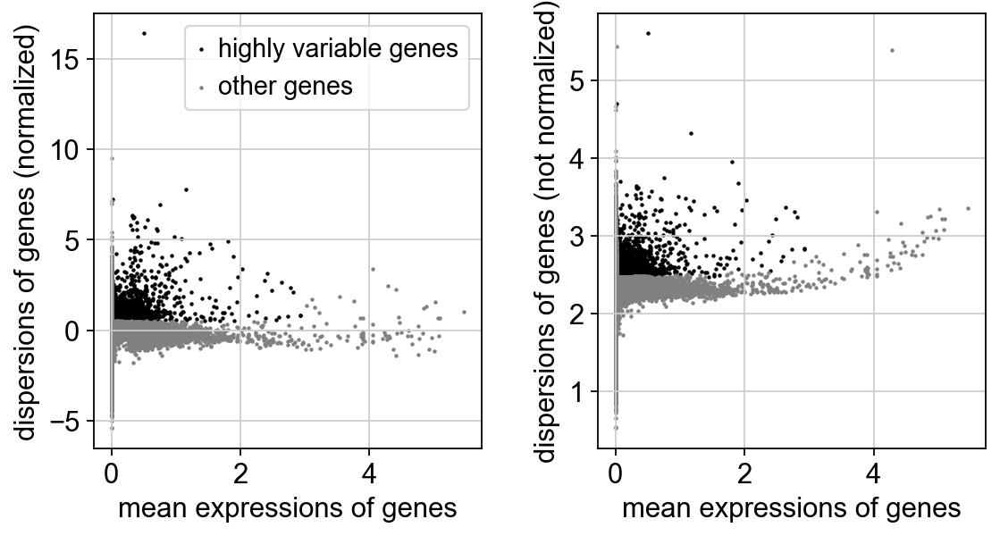

In [22]:
# PLOT IT OUT
sc.pl.highly_variable_genes(adata)

In [23]:
#### To inspect HV genes... first, create a df containing the info. 
hvg = pd.DataFrame(adata.var.highly_variable)
hvg


,highly_variable
AL627309.1,False
AL627309.5,False
LINC01409,False
FAM87B,False
LINC01128,False
...,...
AL354822.1,False
AL592183.1,True
AC240274.1,False
AC004556.3,False


In [24]:
# to know the str
pd.DataFrame.info(hvg)

<class 'pandas.core.frame.DataFrame'>
Index: 21591 entries, AL627309.1 to AC007325.4
Data columns (total 1 columns):
 #   Column           Non-Null Count  Dtype
---  ------           --------------  -----
 0   highly_variable  21591 non-null  bool 
dtypes: bool(1)
memory usage: 705.8+ KB


In [25]:
# add colname 
hvg.columns = ['HV_status']
print(hvg)

            HV_status
AL627309.1      False
AL627309.5      False
LINC01409       False
FAM87B          False
LINC01128       False
...               ...
AL354822.1      False
AL592183.1       True
AC240274.1      False
AC004556.3      False
AC007325.4      False

[21591 rows x 1 columns]


In [26]:
# get only the True ones.. 
hvg_T = hvg.loc[hvg['HV_status'] == True]
hvg_T[:50]

,HV_status
FAM41C,True
TNFRSF4,True
SCNN1D,True
ACAP3,True
MMP23B,True
SLC35E2A,True
DNAJC11,True
RERE,True
RERE-AS1,True
SPSB1,True


In [103]:
########### see all the variables here..   ##############
%who_ls

['Path',
 'adata',
 'bdata',
 'ddl',
 'hvg',
 'hvg_T',
 'my_order',
 'os',
 'out_path',
 'pd',
 'sc',
 'tqdm']

## removing VDJ genes from HVG genes manually

In [27]:
#### Because this is 10x 5' data - there is a lot of VDJ genes that are picked up (in abundance), and because they do look different from each donor, it can be mis-computed as HVG - REMOVE THEM.

import re

for i in adata.var.index:
    if re.search("^TR[AB][VDJ]|^IG[HKL][VDJC]", i):
        adata.var.at[i, "highly_variable"] = False



#### It uses the re module, which stands for regular expressions, to search for specific patterns in the index values.
#Let's break down the code step by step:

# for i in adata.var.index:: This initiates a loop that iterates over each value (i) in the index of the adata.var object.

# if re.search("^TR[AB][VDJ]|^IG[HKL][VDJC]", i):: This line uses regular expressions to check if the current index value (i) matches a specific pattern. The regular expression pattern is as follows:

# ^: Asserts the position at the start of the string.
# TR: Matches the characters "TR" literally.
# [AB]: Matches either "A" or "B".
# [VDJ]: Matches either "V", "D", or "J".
# |: Acts as an OR operator in regular expressions.
# ^IG: Matches the characters "IG" literally.
# [HKL]: Matches either "H", "K", or "L".
# [VDJC]: Matches either "V", "D", "J", or "C".
# The regular expression is looking for index values that either start with "TR", followed by "A" or "B", and then one of "V", "D", or "J", OR index values that start with "IG", followed by "H", "K", or "L", and then one of "V", "D", "J", or "C".

# adata.var.at[i, "highly_variable"] = False: If the regular expression matches the current index value (i), it sets the corresponding value of "highly_variable" in the adata.var object to False.

# In summary, this modified code is looping through the index values of the adata.var object and using a regular expression to identify specific patterns in the index values that match either the TRABVDJ or the IGHKVDJC pattern. If a match is found, it sets the corresponding "highly_variable" value to False. This code could be used to mark certain entries in the adata.var object as not highly variable based on the new regular expression pattern. Just like before, it's important to ensure that you understand the data and the intention behind the code before executing it, as regular expressions can be tricky and their behavior can be sensitive to small changes in the pattern.

#The purpose of this code seems to be to mark certain entries in the adata.var object as "not highly_variable" based on the matching pattern defined in the regular expression.

In [28]:
# re-inspect hvg list
hvg = pd.DataFrame(adata.var.highly_variable)
hvg_T = hvg.loc[hvg['highly_variable'] == True]
hvg_T #2285 genes...


,highly_variable
FAM41C,True
TNFRSF4,True
SCNN1D,True
ACAP3,True
MMP23B,True
...,...
MT-ND4L,True
MT-ND4,True
MT-CYB,True
MAFIP,True


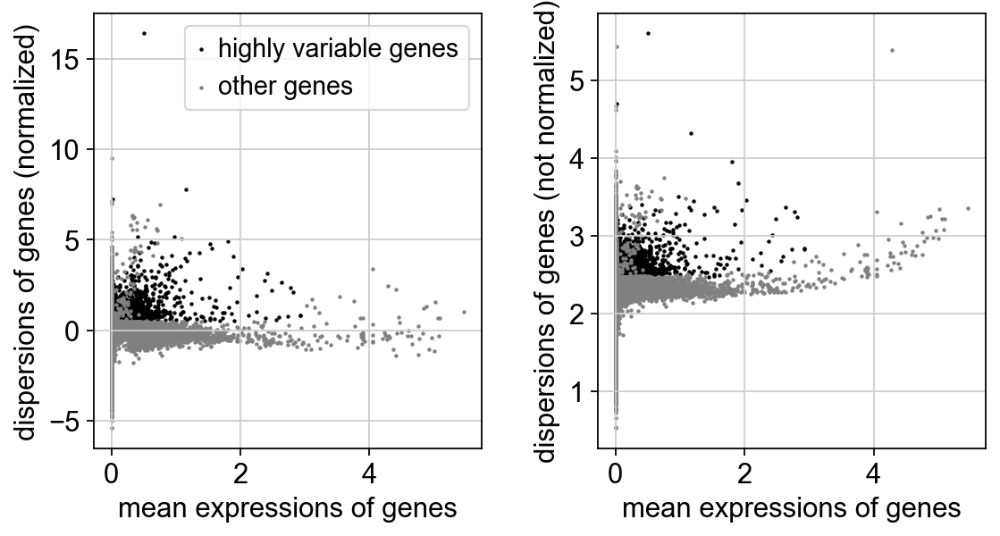

In [29]:
sc.pl.highly_variable_genes(adata)

In [30]:
# Set the .raw attribute of the AnnData object to the normalized and logarithmized raw gene expression for later use in differential testing and visualizations of gene expression. This simply freezes the state of the AnnData object.
# You can get back an AnnData of the object in .raw by calling .raw.to_adata().
adata.raw = adata

# Perform Dimensionality Reduction

In [31]:
# Actually do the filtering for PCA
adata = adata[:,adata.var.highly_variable].copy()        # all rows/indexes : columns only selecting for those within high_variable, and then making a copy of itself 
adata


AnnData object with n_obs × n_vars = 71564 × 2285
    obs: 'sample', 'sort_type', 'donor', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'scrublet_score', 'n_genes', 'gmm_pct_count_clusters_keep', 'is_doublet', 'filter_rna', 'batch'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'filter_rna_colors', 'sample_colors', 'log1p', 'hvg'

In [32]:
# regress out effects of total counts per cell and percentage of mt genes expressed. 
sc.pp.regress_out(adata, ["total_counts", "pct_counts_mt"])

In [33]:
#scale each gene to unit variance. Clip values exceeding std of 10. 
sc.pp.scale(adata, max_value = 10)


In [34]:
## get PCA
sc.tl.pca(adata, svd_solver="arpack")

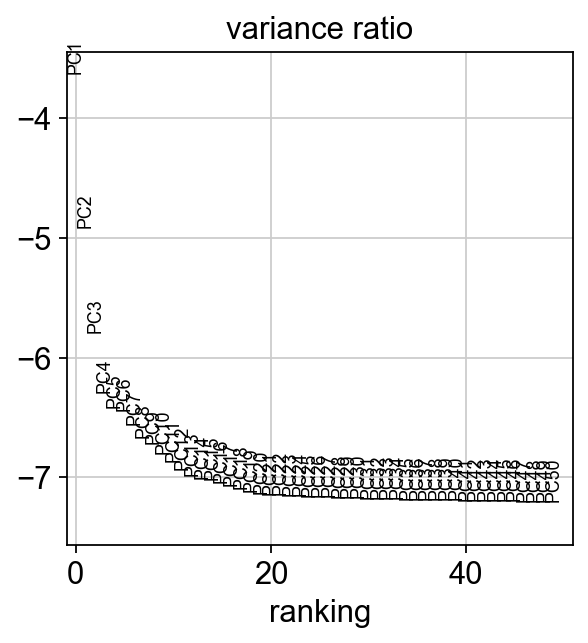

In [35]:
# get elbow plot to see variance contribution by each pc
sc.pl.pca_variance_ratio(adata, log=True, n_pcs = 50)

In [36]:
## Computing neighbourhood graph - here UMAP
sc.pp.neighbors(adata, n_neighbors = 10, n_pcs=40)
## n_neighbor: The size of local neighborhood (in terms of number of neighboring data
#points) used for manifold approximation. Larger values result in more
#global views of the manifold, while smaller values result in more local
#data being preserved. In general values should be in the range 2 to 100.
#If `knn` is `True`, number of nearest neighbors to be searched. If `knn`
#is `False`, a Gaussian kernel width is set to the distance of the
#`n_neighbors` neighbor.

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


## UMAP VISUALISATION

In [37]:
# compute UMAP
sc.tl.umap(adata, min_dist=0.3) # 0.3 is personal preference

/Users/uqssoon/anaconda3/envs/Jaz2023_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/Users/uqssoon/anaconda3/envs/Jaz2023_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/Users/uqssoon/anaconda3/envs/Jaz2023_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


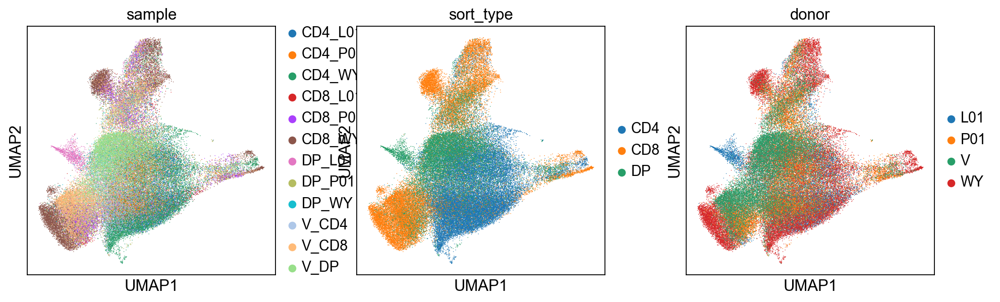

In [38]:
# visualise umap
sc.pl.umap(
    adata,
    color=[
        "sample",
        "sort_type",
        "donor",
    ],
)

In [39]:
#### plotting multiple small umaps of the same parameter, similar to faceting/split.by

## https://github.com/scverse/scanpy/issues/955
def cluster_small_multiples(adata, clust_key, size=30, frameon=False, legend_loc=None, **kwargs):
    tmp = adata.copy()

    for i,clust in enumerate(adata.obs[clust_key].cat.categories):
        tmp.obs[clust] = adata.obs[clust_key].isin([clust]).astype('category')
        tmp.uns[clust+'_colors'] = ['#d3d3d3', adata.uns[clust_key+'_colors'][i]]

    sc.pl.umap(tmp, groups=tmp.obs[clust].cat.categories[1:].values, color=adata.obs[clust_key].cat.categories.tolist(), size=size, frameon=frameon, legend_loc=legend_loc, **kwargs)

/Users/uqssoon/anaconda3/envs/Jaz2023_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/Users/uqssoon/anaconda3/envs/Jaz2023_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/Users/uqssoon/anaconda3/envs/Jaz2023_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


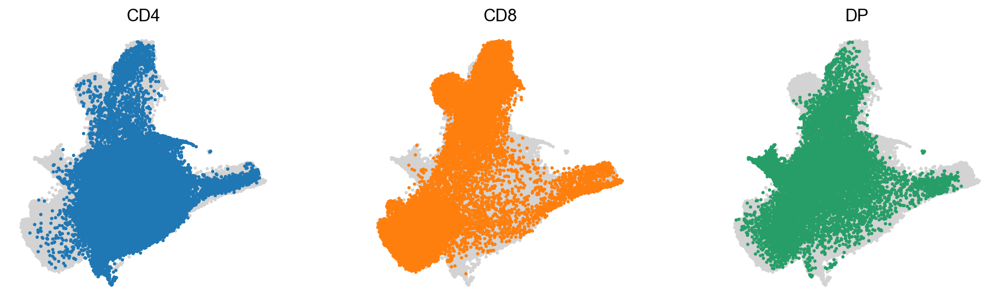

In [40]:
cluster_small_multiples(adata, 'sort_type')

/Users/uqssoon/anaconda3/envs/Jaz2023_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/Users/uqssoon/anaconda3/envs/Jaz2023_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/Users/uqssoon/anaconda3/envs/Jaz2023_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/Users/uqssoon/anaconda3/envs/Jaz2023_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


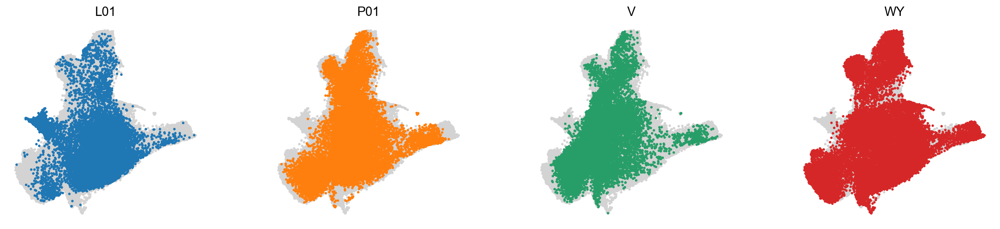

In [41]:
cluster_small_multiples(adata, 'donor')  
# not too much donor biasness.. 

I want to visualise key lineage genes on the UMAP that is subset by their sort_type.

In [47]:
## Can I do a quick QC - subset data by sort type, and plot the relevant marker genes on them?? 
adata.obs.info()
adata_CD4 = adata[adata.obs['sort_type'] == "CD4"]
adata_CD4.obs


<class 'pandas.core.frame.DataFrame'>
Index: 71564 entries, CD4_L01_AAACCTGAGAGCTATA-1 to V_DP_TTTGTCATCTTGTTTG-1
Data columns (total 13 columns):
 #   Column                       Non-Null Count  Dtype   
---  ------                       --------------  -----   
 0   sample                       71564 non-null  category
 1   sort_type                    71564 non-null  category
 2   donor                        71564 non-null  category
 3   n_genes_by_counts            71564 non-null  int32   
 4   total_counts                 71564 non-null  float32 
 5   total_counts_mt              71564 non-null  float32 
 6   pct_counts_mt                71564 non-null  float32 
 7   scrublet_score               71564 non-null  float64 
 8   n_genes                      71564 non-null  int64   
 9   gmm_pct_count_clusters_keep  71564 non-null  bool    
 10  is_doublet                   71564 non-null  category
 11  filter_rna                   71564 non-null  category
 12  batch                 

,sample,sort_type,donor,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,scrublet_score,n_genes,gmm_pct_count_clusters_keep,is_doublet,filter_rna,batch
CD4_L01_AAACCTGAGAGCTATA-1,CD4_L01,CD4,L01,722,1726.0,14.0,0.811124,0.456193,722,True,False,False,0
CD4_L01_AAACCTGAGGAGCGAG-1,CD4_L01,CD4,L01,562,1443.0,15.0,1.039501,0.156962,562,True,False,False,0
CD4_L01_AAACCTGAGGCAGTCA-1,CD4_L01,CD4,L01,507,1141.0,4.0,0.350570,0.216129,507,True,False,False,0
CD4_L01_AAACCTGAGTCAAGCG-1,CD4_L01,CD4,L01,602,1410.0,16.0,1.134752,0.408219,602,True,False,False,0
CD4_L01_AAACCTGAGTCCTCCT-1,CD4_L01,CD4,L01,433,1064.0,7.0,0.657895,0.188953,433,True,False,False,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
V_CD4_TTTGTCACATTACGAC-1,V_CD4,CD4,V,387,755.0,3.0,0.397351,0.164948,387,True,False,False,9
V_CD4_TTTGTCAGTACTTGAC-1,V_CD4,CD4,V,252,516.0,2.0,0.387597,0.138952,252,True,False,False,9
V_CD4_TTTGTCATCCGCAGTG-1,V_CD4,CD4,V,294,513.0,3.0,0.584795,0.235993,294,True,False,False,9
V_CD4_TTTGTCATCTCACATT-1,V_CD4,CD4,V,774,1589.0,5.0,0.314663,0.339450,774,True,False,False,9


/Users/uqssoon/anaconda3/envs/Jaz2023_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


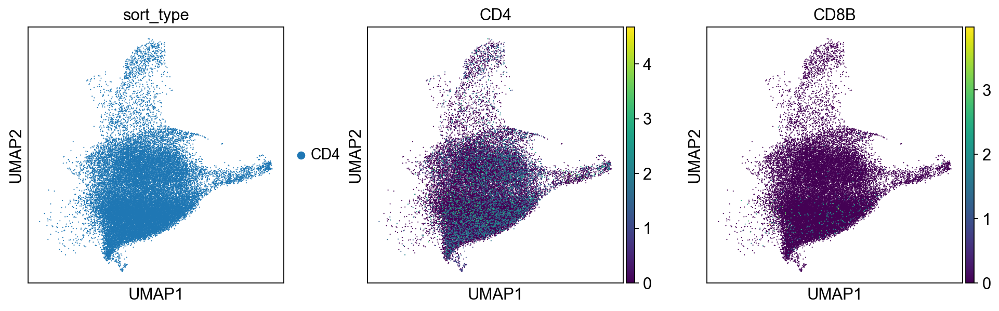

In [52]:
## plot CD8, CD8 on adata_CD4
sc.pl.umap(adata_CD4, color = ["sort_type", "CD4", "CD8B"], ncols = 3)

/Users/uqssoon/anaconda3/envs/Jaz2023_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


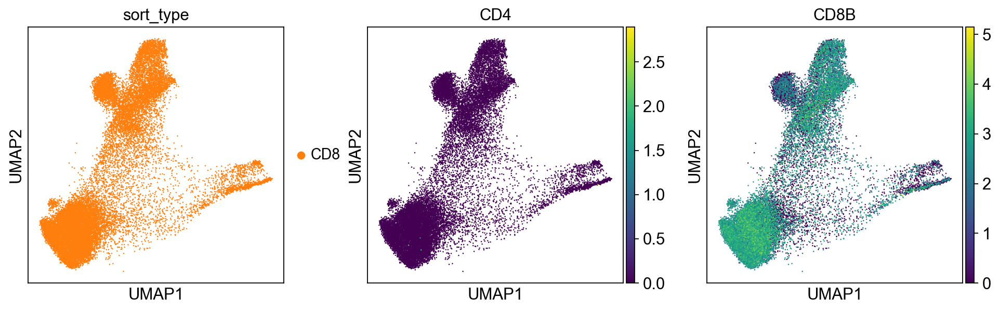

In [53]:
# repeat for CD8 sort.. 
adata_CD8 = adata[adata.obs['sort_type'] == "CD8"]
adata_CD8.obs
sc.pl.umap(adata_CD8, color = ["sort_type", "CD4", "CD8B"], ncols = 3)

/Users/uqssoon/anaconda3/envs/Jaz2023_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


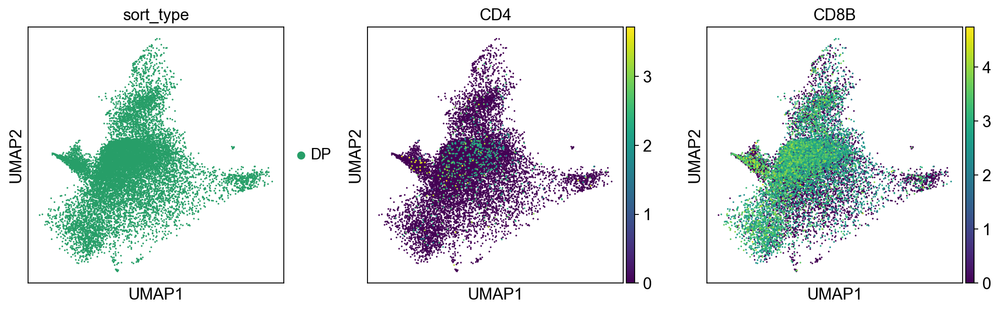

In [55]:
# repeat for DP sort.. 
adata_DP = adata[adata.obs['sort_type'] == "DP"]
adata_DP.obs
sc.pl.umap(adata_DP, color = ["sort_type", "CD4", "CD8B"], ncols = 3)

## expression of CD4 in general isn't great... But most of the DP sorted cells seem to sit closer to the middle where CD4-sorted cells are.

A different way of plotting. 

/Users/uqssoon/anaconda3/envs/Jaz2023_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
/Users/uqssoon/anaconda3/envs/Jaz2023_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


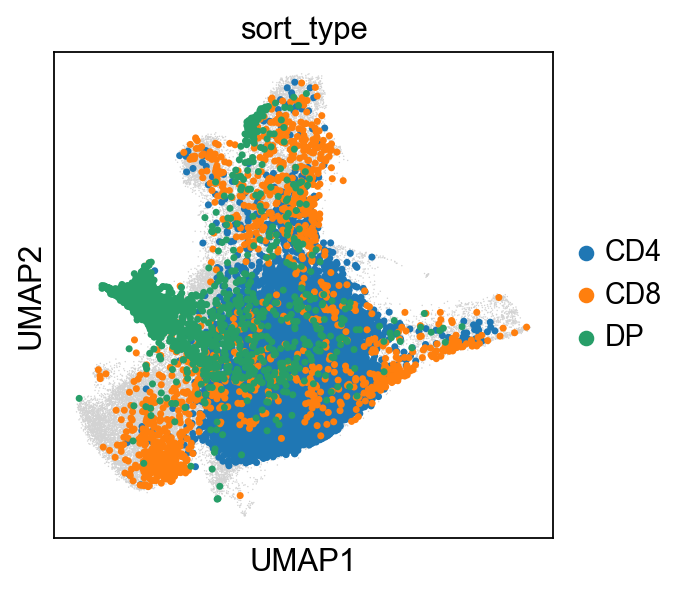

In [56]:
#### This is to only colour cells for a subset of the dataset, the rest will be greyed out. 

# https://scanpy.discourse.group/t/can-you-split-umaps-to-show-differences-between-conditions/716

from matplotlib import pyplot as plt

ax = plt.subplot()
sc.pl.umap(adata, ax=ax, show=False)
sc.pl.umap(adata[adata.obs["donor"].isin(["L01"])], color="sort_type", ax=ax, show=False, size =40)
plt.show()

/Users/uqssoon/anaconda3/envs/Jaz2023_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
/Users/uqssoon/anaconda3/envs/Jaz2023_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


<Axes: title={'center': 'sort_type'}, xlabel='UMAP1', ylabel='UMAP2'>

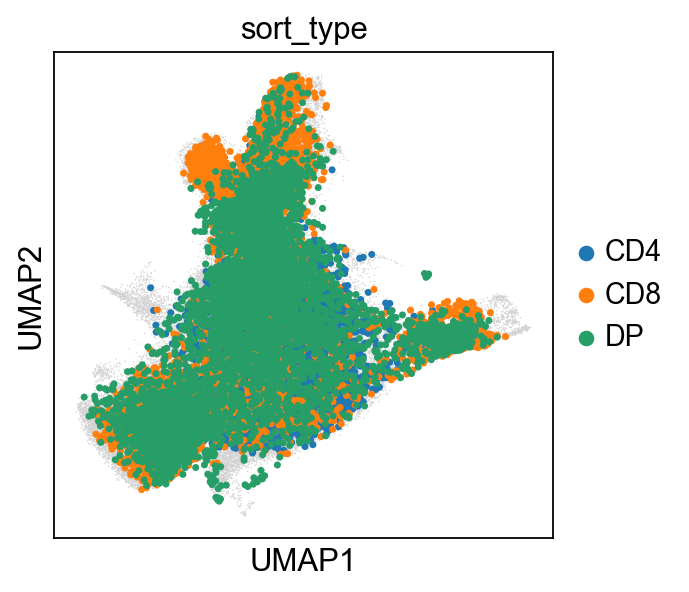

In [57]:
ax = plt.subplot()
sc.pl.umap(adata, ax=ax, show=False)
sc.pl.umap(adata[adata.obs["donor"].isin(["P01"])], color="sort_type", ax=ax, show=False, size = 40)

/Users/uqssoon/anaconda3/envs/Jaz2023_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
/Users/uqssoon/anaconda3/envs/Jaz2023_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


<Axes: title={'center': 'sort_type'}, xlabel='UMAP1', ylabel='UMAP2'>

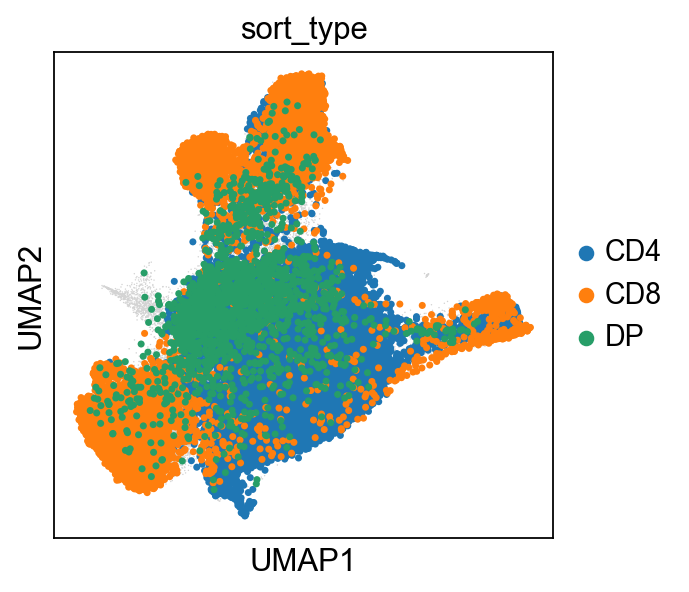

In [58]:
ax = plt.subplot()
sc.pl.umap(adata, ax=ax, show=False)
sc.pl.umap(adata[adata.obs["donor"].isin(["WY"])], color="sort_type", ax=ax, show=False, size = 40)

/Users/uqssoon/anaconda3/envs/Jaz2023_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
/Users/uqssoon/anaconda3/envs/Jaz2023_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


<Axes: title={'center': 'sort_type'}, xlabel='UMAP1', ylabel='UMAP2'>

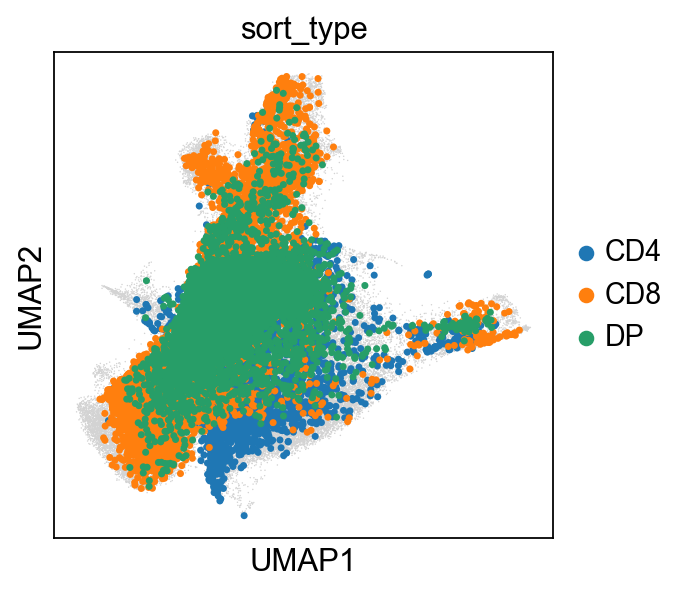

In [60]:
ax = plt.subplot()
sc.pl.umap(adata, ax=ax, show=False)
sc.pl.umap(adata[adata.obs["donor"].isin(["V"])], color="sort_type", ax=ax, show=False, size = 40)

########## most differences in cell distribution seem to be driven by donor differences - affecting mainly the DP sorted cells. 

Kelvin's way of plotting... 

In [13]:
import tools #do this outside first: pip install kttools

In [62]:
## Visualise different CD4 marker genes

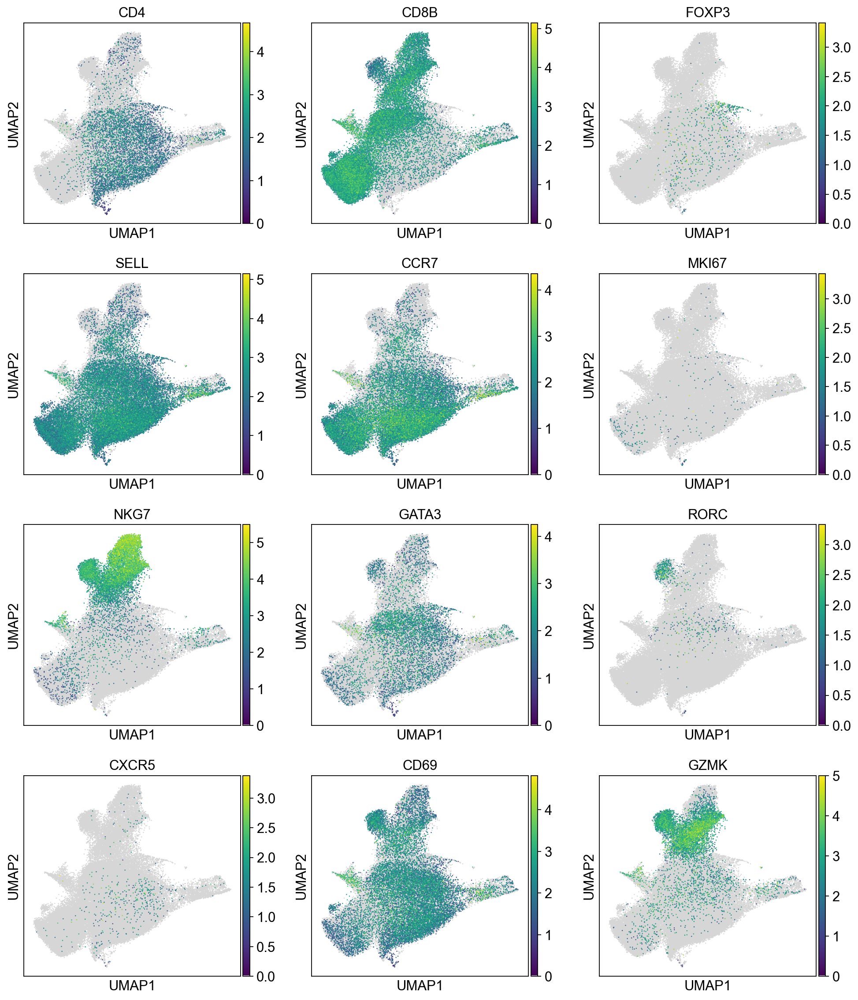

In [65]:
sc.pl.umap(
    adata,
    color=["CD4", "CD8B", "FOXP3", "SELL", "CCR7", "MKI67", "NKG7", "GATA3", "RORC",
    "CXCR5", "CD69", "GZMK"],
    ncols=3,
    size=5,
    color_map=tools.cmp(),
)

/Users/uqssoon/anaconda3/envs/Jaz2023_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


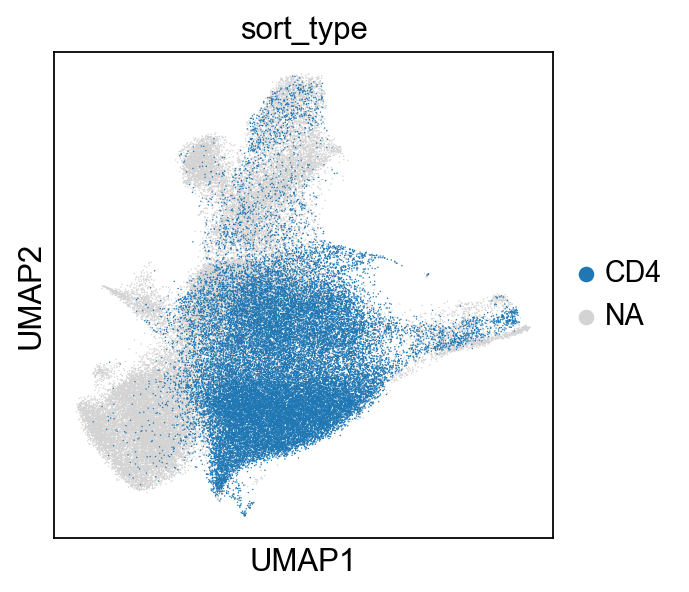

/Users/uqssoon/anaconda3/envs/Jaz2023_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


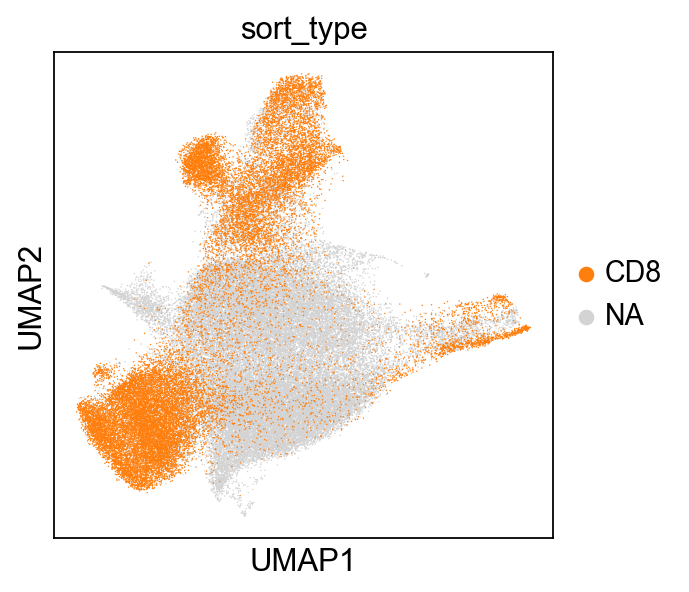

/Users/uqssoon/anaconda3/envs/Jaz2023_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


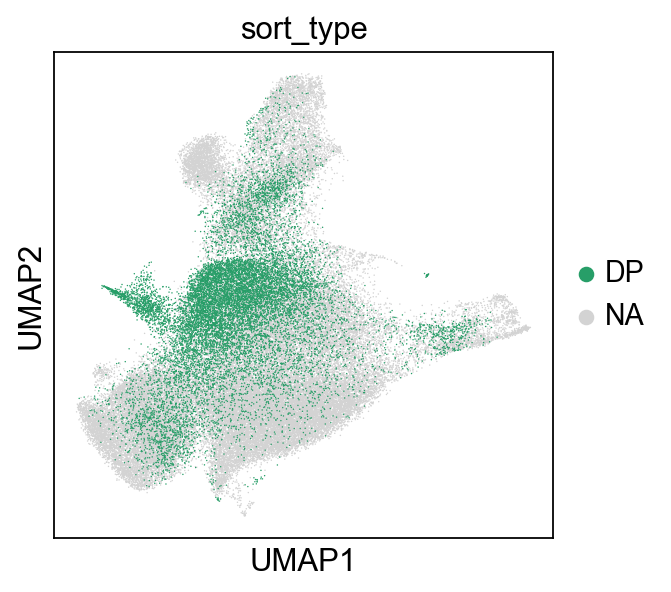

In [66]:
#### ANOTHER WAY OF PLOTTING... 

# where are the DP cells?
for g in ["CD4", "CD8", "DP"]:
    sc.pl.umap(
        adata,
        color=[
            "sort_type",
        ],
        groups=g,
    )

Let's just save this... 

In [68]:
adata.write_h5ad("adata_processed_v2_MS_070823.h5ad", compression="gzip")

## Batch correction with BBKNN

In [9]:
## Running BBKNN 
# https://scanpy-tutorials.readthedocs.io/en/latest/integrating-data-using-ingest.html
# To run BBKNN, we need to start from pre-harmony object so... 

adata = sc.read_h5ad("/Users/uqssoon/Documents/Projects/Jaz-project/Output_MS/objects/adata_processed_v2_MS_070823.h5ad")

In [10]:
# applying bbknn - batch correct by sample so celltype_donor
sc.external.pp.bbknn(adata, batch_key = 'sample')

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [11]:
## plotting it out
# Note: we skip neighbourhood construction step as bbknn does that already
# min_dist : float (default: 0.5). The effective minimum distance between embedded points. Smaller values will result in a more clustered/clumped embedding where nearby points on the manifold are drawn closer together, while larger values will result on a more even dispersal of points. The value should be set relative to the spread value, which determines the scale at which embedded points will be spread out. The default of in the umap-learn package is 0.1.
sc.tl.umap(adata, min_dist = 0.3) #0.3 is personal pref

/Users/uqssoon/anaconda3/envs/Jaz2023_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/Users/uqssoon/anaconda3/envs/Jaz2023_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/Users/uqssoon/anaconda3/envs/Jaz2023_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


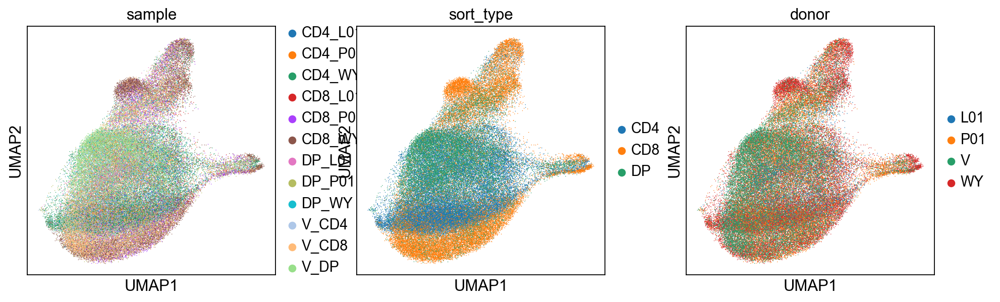

In [12]:
# visualise this.. 

sc.pl.umap(
    adata,
    color=[
        "sample",
        "sort_type",
        "donor",
    ],
)

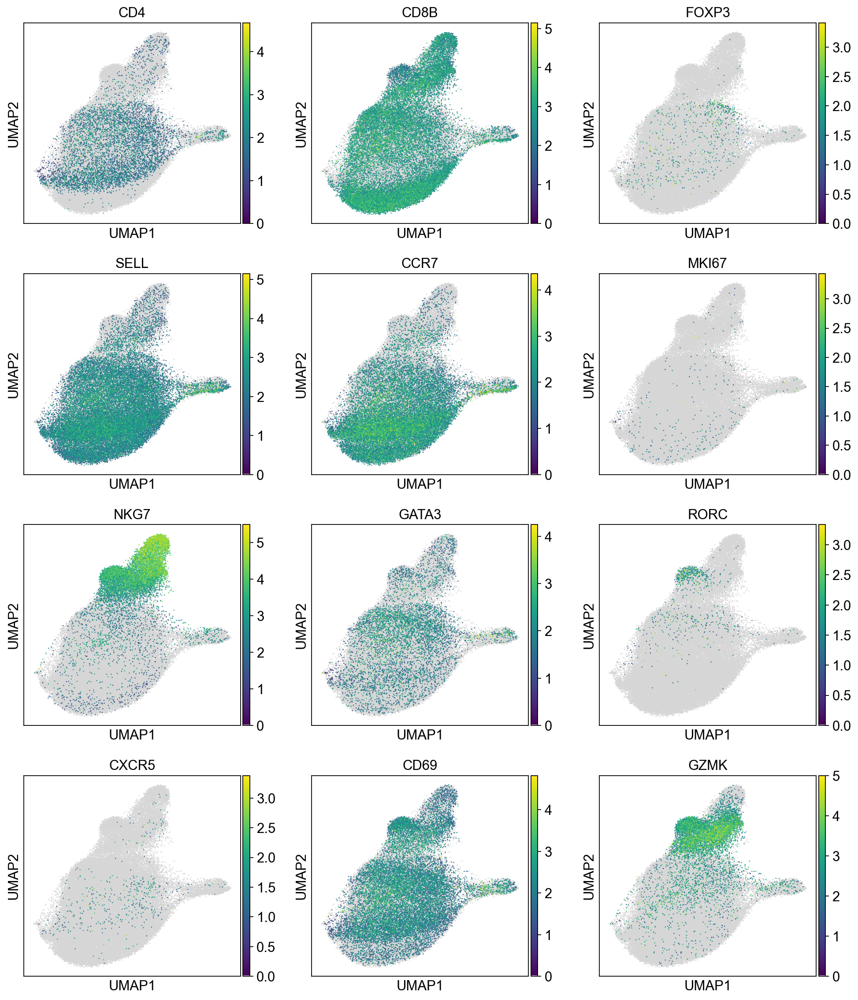

In [14]:
sc.pl.umap(
    adata,
    color=["CD4", "CD8B", "FOXP3", "SELL", "CCR7", "MKI67", "NKG7", "GATA3", "RORC",
    "CXCR5", "CD69", "GZMK"],
    ncols=3,
    size=5,
    color_map=tools.cmp(),
)

# umap seems to cluster more based on "activation status" and then "cell lineage"

/Users/uqssoon/anaconda3/envs/Jaz2023_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/Users/uqssoon/anaconda3/envs/Jaz2023_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


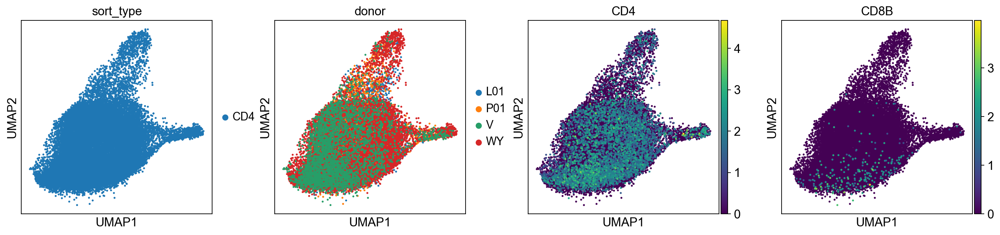

In [23]:
## inspect changes post-batch correction.. 

# inspecting the CD4 sort..
adata_CD4 = adata[adata.obs['sort_type'] == "CD4"]
adata_CD4.obs
sc.pl.umap(adata_CD4, color = ["sort_type", "donor", "CD4", "CD8B"], ncols = 4, size = 20)


/Users/uqssoon/anaconda3/envs/Jaz2023_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/Users/uqssoon/anaconda3/envs/Jaz2023_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


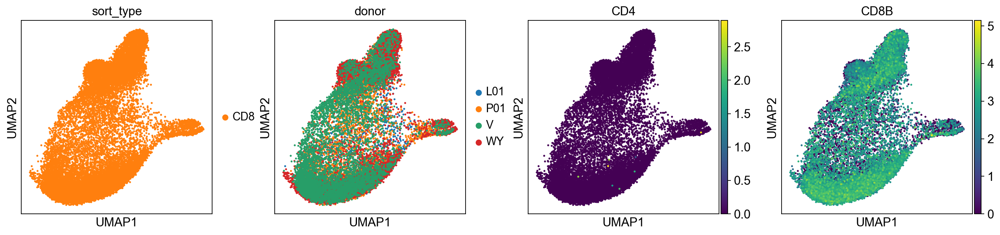

In [24]:
## inspect changes post-batch correction.. 

# inspecting the CD4 sort..
adata_CD8 = adata[adata.obs['sort_type'] == "CD8"]
adata_CD8.obs
sc.pl.umap(adata_CD8, color = ["sort_type", "donor", "CD4", "CD8B"], ncols = 4, size = 20)

/Users/uqssoon/anaconda3/envs/Jaz2023_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/Users/uqssoon/anaconda3/envs/Jaz2023_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


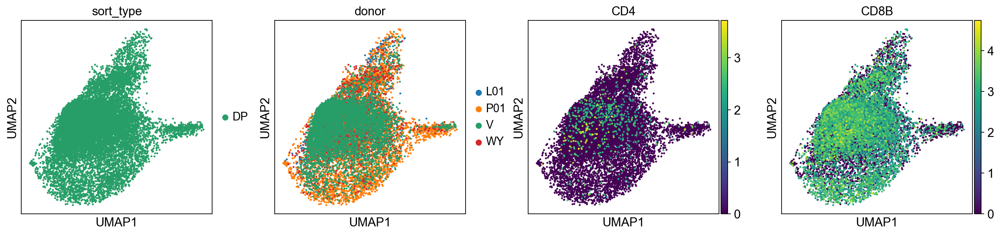

In [25]:
## inspect changes post-batch correction.. 

# inspecting the CD4 sort..
adata_DP = adata[adata.obs['sort_type'] == "DP"]
adata_DP.obs
sc.pl.umap(adata_DP, color = ["sort_type", "donor", "CD4", "CD8B"], ncols = 4, size = 20)

These cells are not too different transcriptionally - because they are simply T cells? 